# Exploring greenhouse gas emissions database of provinces and territories in Canada

In this notebook, I explore greenhouse gas emissions database of all provinces and terittories in Canada using ipython-sql extension. The particular skills include:

- Using foundational SQL statements: SELECT, INSERT, UPDATE, and DELETE
- Filtering result and data using WHERE, COUNT, DISTINCT, and LIMIT
- Working with table: CREATE, ALTER, DROP, JOIN and load tables
- Using string patterns and ranges: ORDER and GROUP and built-in database functions
- Accessing databases with SQL, Python, and create plots using seaborn library (Jupyter notebook)

In [1]:
# Load module ipython-sql
%load_ext sql

In [2]:
# Connect to SQLite3 database
import csv, sqlite3
con = sqlite3.connect("GHG_Can.db")
# cursor object
cur = con.cursor()

In [3]:
# Load database
%sql sqlite:///GHG_Can.db

In [4]:
# Import dataset
import pandas
df = pandas.read_csv('GHG_EconSector_Can_Prov_Terr.csv')

In [5]:
# Convert csv file to a table in sqlite
df.to_sql("GHG_EconSector_Can", con, if_exists='replace', index=False, method="multi")

Count the number of rows in the table.

In [6]:
%sql SELECT COUNT(*) FROM GHG_EconSector_Can;

 * sqlite:///GHG_Can.db
Done.


COUNT(*)
17140


Display all of column names and their data types (equivlent to DESCRIBE command in MySQL)

In [7]:
%sql PRAGMA table_info([GHG_EconSector_Can]);

 * sqlite:///GHG_Can.db
Done.


cid,name,type,notnull,dflt_value,pk
0,Year,INTEGER,0,None,0
1,Region,TEXT,0,None,0
2,Index,INTEGER,0,None,0
3,Source,TEXT,0,None,0
4,Category,TEXT,0,None,0
5,Sub-category,TEXT,0,None,0
6,Sub-sub-category,TEXT,0,None,0
7,Total,INTEGER,0,None,0
8,CO2eq,TEXT,0,None,0
9,Unit,TEXT,0,None,0


List the first ten rows in the table GHG_EconSector_Can.

In [8]:
%sql SELECT * FROM GHG_EconSector_Can limit 10;

 * sqlite:///GHG_Can.db
Done.


Year,Region,Index,Source,Category,Sub-category,Sub-sub-category,Total,CO2eq,Unit
1990,Alberta,0,Provincial Inventory Total,None,None,None,1,165.6496913,Mt
1990,Alberta,1,Oil and Gas,None,None,None,1,61.96130701,Mt
1990,Alberta,2,Oil and Gas,Upstream Oil and Gas,None,None,1,58.35591447,Mt
1990,Alberta,3,Oil and Gas,Upstream Oil and Gas,Natural Gas Production and Processing,None,0,23.93599304,Mt
1990,Alberta,4,Oil and Gas,Upstream Oil and Gas,Conventional Oil Production,None,1,15.49410738,Mt
1990,Alberta,5,Oil and Gas,Upstream Oil and Gas,Conventional Oil Production,Conventional Light Oil Production,0,9.767347202,Mt
1990,Alberta,6,Oil and Gas,Upstream Oil and Gas,Conventional Oil Production,Conventional Heavy Oil Production,0,5.726760174,Mt
1990,Alberta,8,Oil and Gas,Upstream Oil and Gas,"Oil Sands (Mining, In-situ, Upgrading)",None,1,15.05255936,Mt
1990,Alberta,9,Oil and Gas,Upstream Oil and Gas,"Oil Sands (Mining, In-situ, Upgrading)",Mining and Extraction,0,2.173422272,Mt
1990,Alberta,10,Oil and Gas,Upstream Oil and Gas,"Oil Sands (Mining, In-situ, Upgrading)",In-situ,0,4.526705074,Mt


 Find all the rows of with Yukon from the table GHG_EconSector_Can.

In [9]:
Region = "Yukon"
%sql select * from GHG_EconSector_Can where Region = :Region;

 * sqlite:///GHG_Can.db
Done.


Year,Region,Index,Source,Category,Sub-category,Sub-sub-category,Total,CO2eq,Unit
1990,Yukon,0,Territorial Inventory Total,None,None,None,1,0.551845828,Mt
1990,Yukon,1,Oil and Gas,None,None,None,1,0.00032495,Mt
1990,Yukon,2,Oil and Gas,Upstream Oil and Gas,None,None,1,0.00032495,Mt
1990,Yukon,3,Oil and Gas,Upstream Oil and Gas,Natural Gas Production and Processing,None,0,0.00032495,Mt
1990,Yukon,16,Electricity,None,None,None,0,0.090232443,Mt
1990,Yukon,17,Transport,None,None,None,1,0.281138242,Mt
1990,Yukon,18,Transport,Passenger Transport,None,None,1,0.147785109,Mt
1990,Yukon,19,Transport,Passenger Transport,"Cars, Light Trucks and Motorcycles",None,0,0.108815745,Mt
1990,Yukon,20,Transport,Passenger Transport,"Bus, Rail and Aviation",None,0,0.038969364,Mt
1990,Yukon,21,Transport,Freight Transport,None,None,1,0.10950693,Mt


Count all rows with amount CO2 emissions greater than 100 Mt.

In [10]:
%sql SELECT COUNT(*) FROM GHG_EconSector_Can WHERE CO2eq > 100.0;

 * sqlite:///GHG_Can.db
Done.


COUNT(*)
6492


List all Regions with the amount of CO2 emissions greater than 50 Mt.

In [11]:
%sql SELECT Region FROM GHG_EconSector_Can WHERE CO2eq > 50.0;

 * sqlite:///GHG_Can.db
Done.


Region
Alberta
Alberta
Alberta
Alberta
Alberta
Alberta
Alberta
Alberta
Alberta
British Columbia


Since SQLite doesn't support dashes in the column name, we can use ALTER and RENAME COLUMN to convert all dashes into underscores.

In [12]:
%sql ALTER TABLE GHG_EconSector_Can RENAME COLUMN `Sub-sub-category` TO Sub_sub_category;
%sql ALTER TABLE GHG_EconSector_Can RENAME COLUMN `Sub-category` TO Sub_category;
# View the new column names
%sql SELECT * FROM GHG_EconSector_Can limit 10;

 * sqlite:///GHG_Can.db
Done.
 * sqlite:///GHG_Can.db
Done.
 * sqlite:///GHG_Can.db
Done.


Year,Region,Index,Source,Category,Sub_category,Sub_sub_category,Total,CO2eq,Unit
1990,Alberta,0,Provincial Inventory Total,None,None,None,1,165.6496913,Mt
1990,Alberta,1,Oil and Gas,None,None,None,1,61.96130701,Mt
1990,Alberta,2,Oil and Gas,Upstream Oil and Gas,None,None,1,58.35591447,Mt
1990,Alberta,3,Oil and Gas,Upstream Oil and Gas,Natural Gas Production and Processing,None,0,23.93599304,Mt
1990,Alberta,4,Oil and Gas,Upstream Oil and Gas,Conventional Oil Production,None,1,15.49410738,Mt
1990,Alberta,5,Oil and Gas,Upstream Oil and Gas,Conventional Oil Production,Conventional Light Oil Production,0,9.767347202,Mt
1990,Alberta,6,Oil and Gas,Upstream Oil and Gas,Conventional Oil Production,Conventional Heavy Oil Production,0,5.726760174,Mt
1990,Alberta,8,Oil and Gas,Upstream Oil and Gas,"Oil Sands (Mining, In-situ, Upgrading)",None,1,15.05255936,Mt
1990,Alberta,9,Oil and Gas,Upstream Oil and Gas,"Oil Sands (Mining, In-situ, Upgrading)",Mining and Extraction,0,2.173422272,Mt
1990,Alberta,10,Oil and Gas,Upstream Oil and Gas,"Oil Sands (Mining, In-situ, Upgrading)",In-situ,0,4.526705074,Mt


Write a query that returns only distinct Sub_category values

In [13]:
%sql select distinct Sub_category from GHG_EconSector_Can;

 * sqlite:///GHG_Can.db
Done.


Sub_category
None
Natural Gas Production and Processing
Conventional Oil Production
"Oil Sands (Mining, In-situ, Upgrading)"
"Oil, Natural Gas and CO2 Transmission"
Petroleum Refining
Natural Gas Distribution
"Cars, Light Trucks and Motorcycles"
"Bus, Rail and Aviation"
"Heavy Duty Trucks, Rail"


Create a scatter plot using the variables Year and CO2eq.We can see that as CO2eq rises with time. The two histograms at the margins of the graph are equally distributed. We also see that the points on the scatter plot are closer to a straight line which incidcates a positive correlation between the two variables.

 * sqlite:///GHG_Can.db
Done.


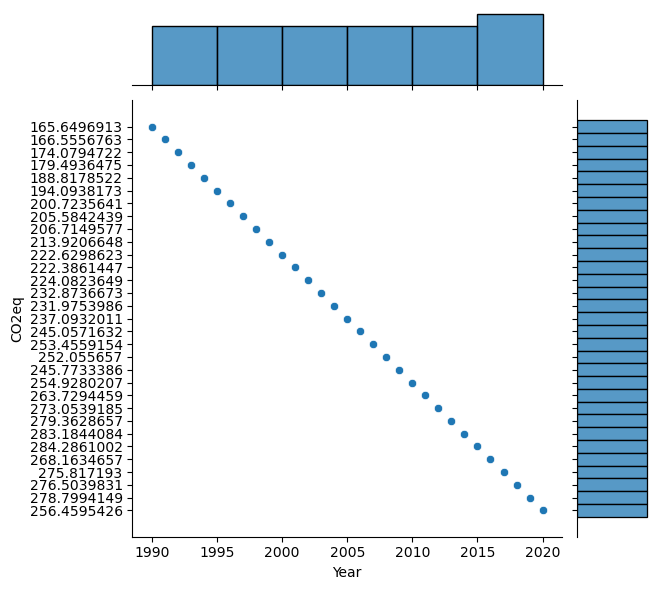

In [14]:
import seaborn as sns

CO2eq_vs_time = %sql SELECT Year, CO2eq FROM GHG_EconSector_Can GROUP BY Year;
plot = sns.jointplot(x='Year',y='CO2eq', kind = "scatter", data=CO2eq_vs_time.DataFrame())

List all rows with Category involving 'Transport' and Sub_category containing 'Aviation'

In [15]:
%sql SELECT * FROM GHG_EconSector_Can WHERE Category LIKE '%Transport%'and Sub_category LIKE '%Aviation%';

 * sqlite:///GHG_Can.db
Done.


Year,Region,Index,Source,Category,Sub_category,Sub_sub_category,Total,CO2eq,Unit
1990,Alberta,20,Transport,Passenger Transport,"Bus, Rail and Aviation",None,0,1.017692964,Mt
1990,Alberta,23,Transport,Freight Transport,Aviation and Marine,None,0,0.234018298,Mt
1990,British Columbia,20,Transport,Passenger Transport,"Bus, Rail and Aviation",None,0,1.223775987,Mt
1990,British Columbia,23,Transport,Freight Transport,Aviation and Marine,None,0,0.8557148,Mt
1990,Canada,20,Transport,Passenger Transport,"Bus, Rail and Aviation",None,0,7.134785455,Mt
1990,Canada,23,Transport,Freight Transport,Aviation and Marine,None,0,4.638052996,Mt
1990,Manitoba,20,Transport,Passenger Transport,"Bus, Rail and Aviation",None,0,0.425576983,Mt
1990,Manitoba,23,Transport,Freight Transport,Aviation and Marine,None,0,0.098800205,Mt
1990,New Brunswick,20,Transport,Passenger Transport,"Bus, Rail and Aviation",None,0,0.151550144,Mt
1990,New Brunswick,23,Transport,Freight Transport,Aviation and Marine,None,0,0.212014717,Mt


Get average CO2 emissions by regions. We can see that Alberta, with its economy strongly dependent on oil and gas sector, accounts for about 36% of the total CO2 emissions in Canada.

In [16]:
%sql SELECT Region, AVG(CO2eq) AS AVE_Region_Emissions FROM GHG_EconSector_Can GROUP BY Region;

 * sqlite:///GHG_Can.db
Done.


Region,AVE_Region_Emissions
Alberta,17.547516212399874
British Columbia,4.973032870761247
Canada,48.53576720098493
Manitoba,1.6474997587484388
New Brunswick,1.2428123016069506
Newfoundland and Labrador,0.8996234752613629
Northwest Territories,0.1562942085494792
Northwest Territories and Nunavut,0.16665612796581217
Nova Scotia,1.342748988820673
Nunavut,0.08132073591836733


Retrieve the list of 5 Sources with the lowest CO2 emissions sorted in ascending order based on CO2eq.

In [17]:
%sql SELECT Region, Source, CO2eq FROM GHG_EconSector_Can GROUP BY Source ORDER BY CO2eq ASC LIMIT 5;

 * sqlite:///GHG_Can.db
Done.


Region,Source,CO2eq
Alberta,Coal Production,0.596288166
Northwest Territories and Nunavut,Territorial Inventory Total,1.785435041
Alberta,Buildings,12.02922198
Alberta,Heavy Industry,12.59132594
Alberta,Agriculture,14.94769117


List the Source with highest CO2 emissions  

In [18]:
%sql SELECT Source, COUNT(CO2eq) AS RANK FROM GHG_EconSector_Can GROUP BY Source ORDER BY RANK DESC LIMIT 1;

 * sqlite:///GHG_Can.db
Done.


Source,RANK
Oil and Gas,3463


Retieve the Year and Region with the most CO2 emissions.

In [19]:
%sql SELECT Year, Region FROM GHG_EconSector_Can WHERE CO2eq = (SELECT MAX(CO2eq) FROM GHG_EconSector_Can);

 * sqlite:///GHG_Can.db
Done.


Year,Region
2005,Northwest Territories
2005,Northwest Territories
2005,Northwest Territories
2005,Nunavut
2005,Nunavut
2005,Nunavut
2006,Northwest Territories
2006,Northwest Territories
2006,Northwest Territories
2006,Nunavut


Create a view -CO2_Source_temp- from GHG_EconSector_Can table.

In [20]:
%sql CREATE VIEW CO2_Source_temp AS SELECT CAST (Year AS TIMESTAMP), Source, CO2eq, Unit FROM GHG_EconSector_Can;
%sql SELECT * FROM CO2_Source_temp;

 * sqlite:///GHG_Can.db
Done.
 * sqlite:///GHG_Can.db
Done.


CAST (Year AS TIMESTAMP),Source,CO2eq,Unit
1990,Provincial Inventory Total,165.6496913,Mt
1990,Oil and Gas,61.96130701,Mt
1990,Oil and Gas,58.35591447,Mt
1990,Oil and Gas,23.93599304,Mt
1990,Oil and Gas,15.49410738,Mt
1990,Oil and Gas,9.767347202,Mt
1990,Oil and Gas,5.726760174,Mt
1990,Oil and Gas,15.05255936,Mt
1990,Oil and Gas,2.173422272,Mt
1990,Oil and Gas,4.526705074,Mt


Delete CO2_Source view which we created in the last section.

In [21]:
%sql DROP VIEW CO2_Source_temp;

 * sqlite:///GHG_Can.db
Done.


[]

Create a table with 4 columns Year, Source, CO2eq, and Unit from the table GHG_EconSector_Can. 

In [22]:
%sql CREATE TABLE CO2_vs_Source AS SELECT Year, Source, CO2eq, Unit FROM GHG_EconSector_Can;
%sql SELECT COUNT(*) FROM CO2_vs_Source;
%sql SELECT * FROM CO2_vs_Source;

 * sqlite:///GHG_Can.db
(sqlite3.OperationalError) table CO2_vs_Source already exists
[SQL: CREATE TABLE CO2_vs_Source AS SELECT Year, Source, CO2eq, Unit FROM GHG_EconSector_Can;]
(Background on this error at: https://sqlalche.me/e/14/e3q8)
 * sqlite:///GHG_Can.db
Done.
 * sqlite:///GHG_Can.db
Done.


Year,Source,CO2eq,Unit
1990,Provincial Inventory Total,165.6496913,Mt
1990,Oil and Gas,61.96130701,Mt
1990,Oil and Gas,58.35591447,Mt
1990,Oil and Gas,23.93599304,Mt
1990,Oil and Gas,15.49410738,Mt
1990,Oil and Gas,9.767347202,Mt
1990,Oil and Gas,5.726760174,Mt
1990,Oil and Gas,15.05255936,Mt
1990,Oil and Gas,2.173422272,Mt
1990,Oil and Gas,4.526705074,Mt


Insert a row with dat into the newly created table CO2_vs_Source.

In [23]:
%sql INSERT INTO CO2_vs_Source(Year, Source, CO2eq, Unit) VALUES (1989, 'Electricity', 50, 'Mt');

 * sqlite:///GHG_Can.db
1 rows affected.


[]

Update data in the CO2_vs_Source table with conditions.

In [24]:
%sql UPDATE CO2_vs_Source SET Year = 1988, Source = 'Oil and Gas', CO2eq = 40 WHERE Year = 1989;

 * sqlite:///GHG_Can.db
1 rows affected.


[]

Delete a row with dat into the newly created table CO2_Source.

In [25]:
%sql DELETE FROM CO2_vs_Source WHERE Year = 1988;

 * sqlite:///GHG_Can.db
1 rows affected.


[]

Create CO2_vs_Region table with 4 columns Region, Category, CO2eq, and Unit from the table GHG_EconSector_Can.

In [26]:
%sql CREATE TABLE CO2_vs_Region AS SELECT Region, Category, CO2eq, Unit FROM GHG_EconSector_Can;
%sql SELECT * FROM CO2_vs_Region;

 * sqlite:///GHG_Can.db
(sqlite3.OperationalError) table CO2_vs_Region already exists
[SQL: CREATE TABLE CO2_vs_Region AS SELECT Region, Category, CO2eq, Unit FROM GHG_EconSector_Can;]
(Background on this error at: https://sqlalche.me/e/14/e3q8)
 * sqlite:///GHG_Can.db
Done.


Region,Category,CO2eq,Unit
Alberta,None,165.6496913,Mt
Alberta,None,61.96130701,Mt
Alberta,Upstream Oil and Gas,58.35591447,Mt
Alberta,Upstream Oil and Gas,23.93599304,Mt
Alberta,Upstream Oil and Gas,15.49410738,Mt
Alberta,Upstream Oil and Gas,9.767347202,Mt
Alberta,Upstream Oil and Gas,5.726760174,Mt
Alberta,Upstream Oil and Gas,15.05255936,Mt
Alberta,Upstream Oil and Gas,2.173422272,Mt
Alberta,Upstream Oil and Gas,4.526705074,Mt


Join two tables that we just created with the data at the path listed below to get list of customers with confirmed email addresses.

Use INNER JOIN clause to combine columns from tables CO2_vs_Source and CO2_vs_Region.

In [27]:
%sql SELECT Year, Source, Region, Category FROM CO2_vs_Source INNER JOIN CO2_vs_Region ON CO2_vs_Source.CO2eq = CO2_vs_Region.CO2eq;

 * sqlite:///GHG_Can.db
Done.


Year,Source,Region,Category
1990,Provincial Inventory Total,Alberta,None
1990,Oil and Gas,Alberta,None
1990,Oil and Gas,Alberta,Upstream Oil and Gas
1990,Oil and Gas,Alberta,Upstream Oil and Gas
1990,Oil and Gas,Alberta,Upstream Oil and Gas
1990,Oil and Gas,Alberta,Upstream Oil and Gas
1990,Oil and Gas,Alberta,Upstream Oil and Gas
1990,Oil and Gas,Alberta,Upstream Oil and Gas
1990,Oil and Gas,Alberta,Upstream Oil and Gas
1990,Oil and Gas,Canada,Upstream Oil and Gas
